<a href="https://colab.research.google.com/github/SJRUni/GEOG5990M/blob/main/GEOG5003M_Final_Project_202324.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# GEOG5003M Final Assignment
Student ID number: 202324

GitHub repo link: https://github.com/SJRUni/GEOG5990M

Word count limit= 1,500 words max (markdown cells only, excluding readme)

## Brief Project Summary

Access to green space is generally believed to be associated with better overall health. This project intends to determine if there is a link between access to green space and health outcomes. The intention that this could be used to inform policy decisions if areas of poor health and poor access to green space are identified.

The project compares Office for National Statistics data on Green Space Accessibility and the Index of Multiple deprivation Health Domain as a for health outcomes.

## Data Import and Manipulation

In [9]:
# import any  required packages
!pip install contextily
!pip install geoplot
!pip install git+https://github.com/pmdscully/geo_northarrow.git
!pip install mapclassify


# read in required packages# import required packages for data manipulation
import pandas as pds
import geopandas as gpd
from scipy import stats
import numpy as np

# for visualisation
import seaborn as sns
import matplotlib.pyplot as plt

import pyproj
import contextily as ctx

import geoplot as gplt
import geoplot.crs as gcrs
from geo_northarrow import add_north_arrow
from matplotlib import colors

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 35.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.2/882.2 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 37.2 MB/s eta 0:00:00
  Cloning https://github.com/pmdscully/geo_northarrow.git to /tmp/pip-req-build-4hrm4z5j
  Running command git clone --filter=blob:none --quiet https://github.com/pmdscully/geo_northarrow.git /tmp/pip-req-build-4hrm4z5j
  Resolved https://github.com/pmdscully/geo_northarrow.git to commit 963bdd271707a3bcaa47b2d83d92b88ae0b10950
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for geo_northarrow: filename=geo_northarrow-0.2.0a0-py3-none-any.whl size=14725 sha256=4f022d89258ebcb0789f129a73095ec80e4ee71ce68fd638a7c65eb06935a292
  Stored in directory: /tmp/pip-ephem-wheel-cache-2jwit6bg/wheels/6a/22/96/2e5d1215f457d6b69b44cbaa1a0d3b822bc656dcabcda80095
Suc

In [10]:
# Data downloaded on 24/07/25 from https://www.ons.gov.uk/economy/environmentalaccounts/datasets/accesstopublicgreenspaceingreatbritain
GREEN = pds.read_csv('https://github.com/SJRUni/GEOG5990M/raw/refs/heads/main/Access%20to%20public%20green%20space%20in%20Great%20Britain%202021.zip')
GREEN.tail()

/tmp/ipython-input-2223208180.py:2: DtypeWarning: Columns (0,1,2,3,4,5,6,7,8,9) have mixed types. Specify dtype option on import or set low_memory=False.
  GREEN = pds.read_csv('https://github.com/SJRUni/GEOG5990M/raw/refs/heads/main/Access%20to%20public%20green%20space%20in%20Great%20Britain%202021.zip')


,Country code,Country name,Region code,Region name,County code,County name,LAD code,LAD name,MSOA code,LSOA code,...,Number of flats within rural and built up areas,Number of flats within rural and built up areas with gardens,Average garden size for flats in built up area1,Number of houses within rural and built up area,Number of houses within rural and built up area with gardens,Average garden size for houses within rural and built up area,Unnamed: 27,Unnamed: 28,Unnamed: 29,Unnamed: 30
1048569,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1048570,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1048571,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1048572,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1048573,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
#Clean up erranous columns in df
GREEN = GREEN.drop(columns=['Unnamed: 27', 'Unnamed: 28','Unnamed: 29','Unnamed: 30'])
#Clean up blank rows in df. I believe these were created when the original excel file was converted to csv
GREEN = GREEN.dropna(subset=['LAD code'])
GREEN.tail()

,Country code,Country name,Region code,Region name,County code,County name,LAD code,LAD name,MSOA code,LSOA code,...,"Median combined size of parks and public gardens and playing fields within 1,000 m radius (m2)",Population,Average population per park or public garden or playing field,Median population per park or public garden or playing field,Number of flats within rural and built up areas,Number of flats within rural and built up areas with gardens,Average garden size for flats in built up area1,Number of houses within rural and built up area,Number of houses within rural and built up area with gardens,Average garden size for houses within rural and built up area
41724,W92000004,Wales,W08000001,Wales,W99999999,Wales,W06000024,Merthyr Tydfil,W02000415,W01001300,...,633718.0,1874.0,22629.94,26470.78,37.0,19.13,366.15,688.0,687.0,157.96
41725,W92000004,Wales,W08000001,Wales,W99999999,Wales,W06000024,Merthyr Tydfil,W02000415,W01001301,...,694875.0,1985.0,15968.78,26470.78,21.0,10.86,366.15,788.0,784.0,158.66
41726,W92000004,Wales,W08000001,Wales,W99999999,Wales,W06000024,Merthyr Tydfil,W02000415,W01001308,...,621431.0,1318.0,2736.97,3040.32,3.0,1.55,366.15,506.0,505.0,228.46
41727,W92000004,Wales,W08000001,Wales,W99999999,Wales,W06000024,Merthyr Tydfil,W02000415,W01001309,...,64297.0,1350.0,2189.36,1870.25,18.0,9.31,366.15,526.0,524.0,185.86
41728,W92000004,Wales,W08000001,Wales,W99999999,Wales,W06000024,Merthyr Tydfil,W02000415,W01001898,...,11201.0,1482.0,2679.67,1472.82,37.0,19.13,366.15,647.0,618.0,339.94


In [12]:
# Data downloaded on 24/07/25 from https://opendatacommunities.org/slice?dataset=http%3A%2F%2Fopendatacommunities.org%2Fdata%2Fsocietal-wellbeing%2Fimd2019%2Findices
IMD19 = pds.read_csv('https://github.com/SJRUni/GEOG5990M/raw/refs/heads/main/imd2019lsoa.zip')
IMD19.head()
#IMD dataframe is structured so that each LSOA has multiple lines, one for each value which comprises the Index of Multiple Deprivation,  including a value for the IMD itself.

,FeatureCode,DateCode,Measurement,Units,Value,Indices of Deprivation
0,E01005278,2019,Rank,NaN,11281.0,b. Income Deprivation Domain
1,E01006616,2019,Decile,NaN,1.0,a. Index of Multiple Deprivation (IMD)
2,E01005236,2019,Rank,NaN,4565.0,b. Income Deprivation Domain
3,E01031873,2019,Rank,NaN,25826.0,b. Income Deprivation Domain
4,E01007367,2019,Decile,NaN,2.0,a. Index of Multiple Deprivation (IMD)


This is an example block of mardown text I want to reference <a href="#ref1">[1]</a>. I might need to add some more citations <a href="#ref2">[2]</a><a href="#ref2">[3]</a>



In [13]:
# Filter IMD LSOA df so that it only contains the Health Decile values for each LSOA.
# Note extra space on 'Decile' in measurement column, pretty shoddy!
HDI19_D = IMD19[(IMD19['Indices of Deprivation'] == 'e. Health Deprivation and Disability Domain') & (IMD19['Measurement'] == 'Decile ')]
#Rename columns for clarity
HDI19_D = HDI19_D.rename(columns={'Value':'HDI_Decile', 'FeatureCode':'LSOA_Code'})
#Remove unneccesary columns
HDI19_D = HDI19_D.drop(columns=['Indices of Deprivation', 'Units', 'Measurement'])

HDI19_D.tail()

,LSOA_Code,DateCode,HDI_Decile
476298,E01016475,2019,5.0
476299,E01016248,2019,8.0
476300,E01016119,2019,5.0
476301,E01016097,2019,4.0
476302,E01016140,2019,4.0


In [14]:
#filter IMD LSOA df so that it only contains the Health Score values for each LSOA.
HDI19 = IMD19[(IMD19['Indices of Deprivation'] == 'e. Health Deprivation and Disability Domain') & (IMD19['Measurement'] == 'Score')]
#Rename columns for clarity
HDI19 = HDI19.rename(columns={'Value':'HDI_Score', 'FeatureCode':'LSOA_Code'})
#Remove unneccesary columns
HDI19 = HDI19.drop(columns=['Indices of Deprivation', 'Units', 'Measurement'])

HDI19.tail()

,LSOA_Code,DateCode,HDI_Score
704346,E01019599,2019,-0.922
704347,E01019284,2019,1.267
704348,E01005942,2019,0.407
704349,E01005902,2019,1.170
704350,E01019645,2019,0.220


In [15]:
# Combine resulting HDI Score and HDI Decile columns into singular dataframe.
HDI19 = HDI19.merge(HDI19_D[['LSOA_Code', 'HDI_Decile']], how='left', left_on='LSOA_Code', right_on='LSOA_Code')
HDI19.tail()

,LSOA_Code,DateCode,HDI_Score,HDI_Decile
32839,E01019599,2019,-0.922,9.0
32840,E01019284,2019,1.267,1.0
32841,E01005942,2019,0.407,4.0
32842,E01005902,2019,1.170,1.0
32843,E01019645,2019,0.220,4.0


In [16]:
#Remove unneccesary columns from access to greenspace df
GREEN = GREEN.drop(columns=['Country code', 'Country name','Region code','County code'])

GREEN.head()

,Region name,County name,LAD code,LAD name,MSOA code,LSOA code,Average distance to nearest park or public garden or playing field (m),Median distance to nearest park or public garden or playing field (m),Average size of nearest park or public garden or playing field (m2),Median size of nearest park or public garden or playing field (m2),...,"Median combined size of parks and public gardens and playing fields within 1,000 m radius (m2)",Population,Average population per park or public garden or playing field,Median population per park or public garden or playing field,Number of flats within rural and built up areas,Number of flats within rural and built up areas with gardens,Average garden size for flats in built up area1,Number of houses within rural and built up area,Number of houses within rural and built up area with gardens,Average garden size for houses within rural and built up area
0,North East,Tyne and Wear,E08000021,Newcastle upon Tyne,E02001708,E01008294,220.80,226.24,11356.26,8470.89,...,255331.0,1440.0,1598.26,862.42,62.0,44.59,259.76,570.0,566.0,143.72
1,North East,Tyne and Wear,E08000021,Newcastle upon Tyne,E02001708,E01008306,409.08,317.45,37236.10,38415.29,...,38415.0,1736.0,1593.78,1654.63,121.0,87.02,259.76,875.0,850.0,280.01
2,North East,Tyne and Wear,E08000021,Newcastle upon Tyne,E02001708,E01008307,256.44,232.72,28404.69,32534.36,...,111267.0,1009.0,1188.89,1089.38,122.0,87.74,259.76,425.0,406.0,139.63
3,North East,Tyne and Wear,E08000021,Newcastle upon Tyne,E02001708,E01008308,339.12,291.82,9823.28,5029.49,...,26134.5,3898.0,2393.15,1949.00,345.0,248.12,259.76,1719.0,1685.0,171.19
4,North East,Tyne and Wear,E08000021,Newcastle upon Tyne,E02001708,E01008311,421.00,440.89,73084.97,53363.22,...,189373.0,2122.0,9882.41,9718.50,52.0,37.40,259.76,848.0,840.0,196.03


In [17]:
# Merge the health deprivation data and green space access data
HDIG = GREEN.merge(HDI19[['LSOA_Code', 'HDI_Score', 'HDI_Decile']], how='left', left_on='LSOA code', right_on='LSOA_Code')
# Checking it worked as intended
HDIG.head()

,Region name,County name,LAD code,LAD name,MSOA code,LSOA code,Average distance to nearest park or public garden or playing field (m),Median distance to nearest park or public garden or playing field (m),Average size of nearest park or public garden or playing field (m2),Median size of nearest park or public garden or playing field (m2),...,Median population per park or public garden or playing field,Number of flats within rural and built up areas,Number of flats within rural and built up areas with gardens,Average garden size for flats in built up area1,Number of houses within rural and built up area,Number of houses within rural and built up area with gardens,Average garden size for houses within rural and built up area,LSOA_Code,HDI_Score,HDI_Decile
0,North East,Tyne and Wear,E08000021,Newcastle upon Tyne,E02001708,E01008294,220.80,226.24,11356.26,8470.89,...,862.42,62.0,44.59,259.76,570.0,566.0,143.72,E01008294,-0.050,6.0
1,North East,Tyne and Wear,E08000021,Newcastle upon Tyne,E02001708,E01008306,409.08,317.45,37236.10,38415.29,...,1654.63,121.0,87.02,259.76,875.0,850.0,280.01,E01008306,0.785,2.0
2,North East,Tyne and Wear,E08000021,Newcastle upon Tyne,E02001708,E01008307,256.44,232.72,28404.69,32534.36,...,1089.38,122.0,87.74,259.76,425.0,406.0,139.63,E01008307,1.321,1.0
3,North East,Tyne and Wear,E08000021,Newcastle upon Tyne,E02001708,E01008308,339.12,291.82,9823.28,5029.49,...,1949.00,345.0,248.12,259.76,1719.0,1685.0,171.19,E01008308,0.357,4.0
4,North East,Tyne and Wear,E08000021,Newcastle upon Tyne,E02001708,E01008311,421.00,440.89,73084.97,53363.22,...,9718.50,52.0,37.40,259.76,848.0,840.0,196.03,E01008311,-0.223,6.0


In [18]:
# Remove Welsh LSOAs
HDIG = HDIG[HDIG['County name'] != 'Wales']

In [19]:
# Ensure there are no duplicate LSOAs
HDIG = HDIG.drop_duplicates(subset='LSOA code')

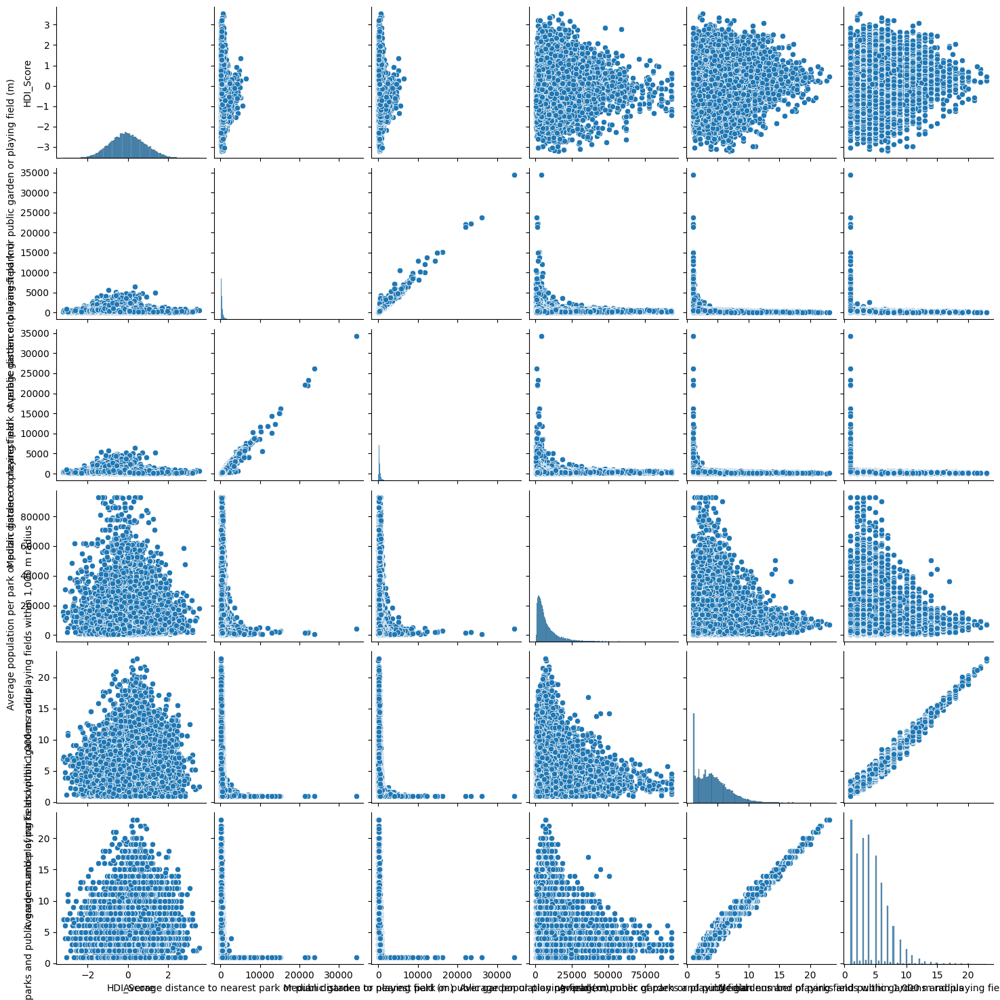

In [20]:
# Exploratory plot of data relationships for dataset across England
sns.pairplot(HDIG[['HDI_Score','Average distance to nearest park or public garden or playing field (m)',
                      'Median distance to nearest park or public garden or playing field (m)',
                      'Average population per park or public garden or playing field',
                      'Average number of parks and public gardens and playing fields within 1,000 m radius',
                      'Median number of parks and public gardens and playing fields within 1,000 m radius']])

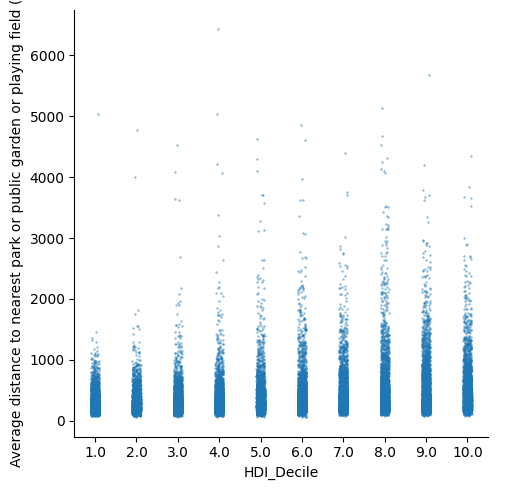

In [21]:
# Visualising a trend in the dataset on a national scale
sns.catplot(x='HDI_Decile', y='Average distance to nearest park or public garden or playing field (m)', data=HDIG, alpha=.5, s=3)

In [22]:
#Create a version for a single LA (Dudley). This code could be reused to produce a subset of any LA by changing the 'Name', or create regional datasets
HDIG_DY = HDIG[HDIG['LAD name'] == 'Dudley'].drop_duplicates(subset='LSOA code')
HDIG_DY.dtypes

,0
Region name,object
County name,object
LAD code,object
LAD name,object
MSOA code,object
LSOA code,object
Average distance to nearest park or public garden or playing field (m),float64
Median distance to nearest park or public garden or playing field (m),float64
Average size of nearest park or public garden or playing field (m2),float64
Median size of nearest park or public garden or playing field (m2),float64


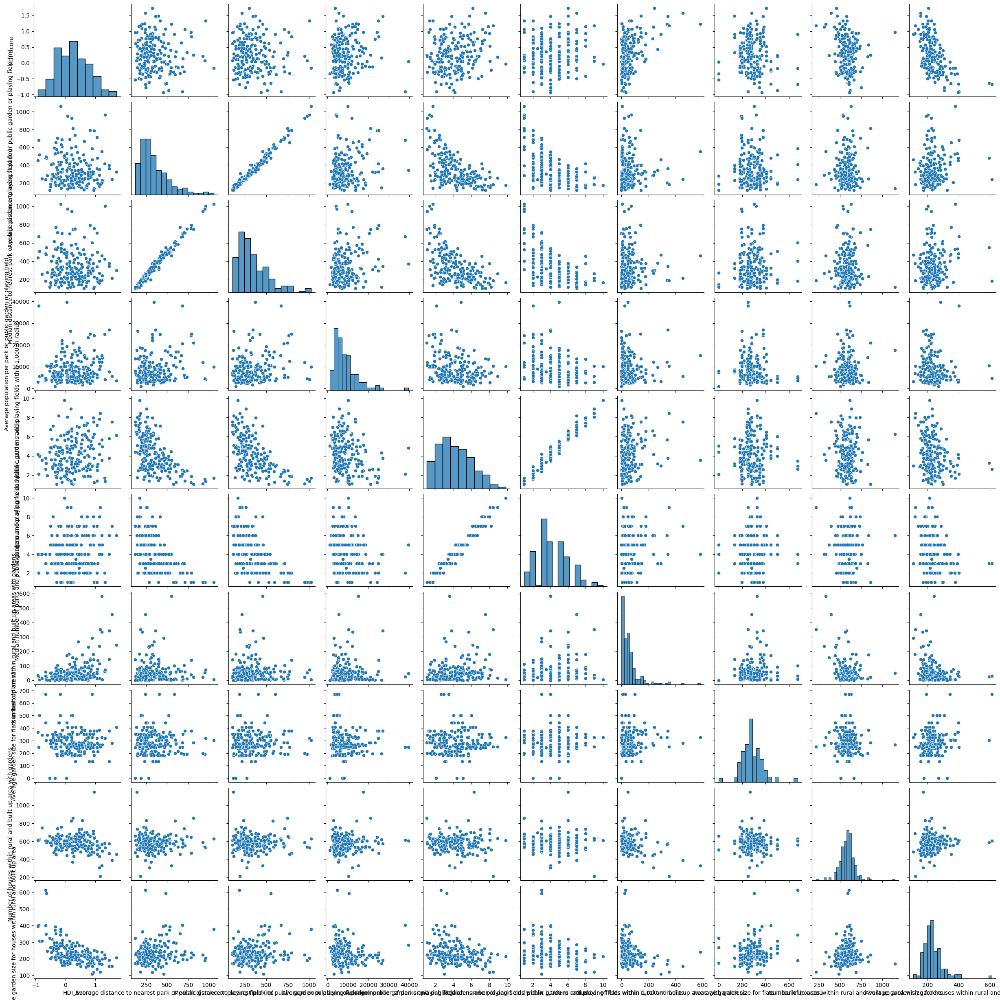

In [23]:
# plot pairplot to see relationships on a more managable scale
sns.pairplot(HDIG_DY[['HDI_Score','Average distance to nearest park or public garden or playing field (m)',
                      'Median distance to nearest park or public garden or playing field (m)',
                      'Average population per park or public garden or playing field',
                      'Average number of parks and public gardens and playing fields within 1,000 m radius',
                      'Median number of parks and public gardens and playing fields within 1,000 m radius',
                      'Number of flats within rural and built up areas with gardens',
                      'Average garden size for flats in built up area1',
                      'Number of houses within rural and built up area with gardens',
                      'Average garden size for houses within rural and built up area ']])

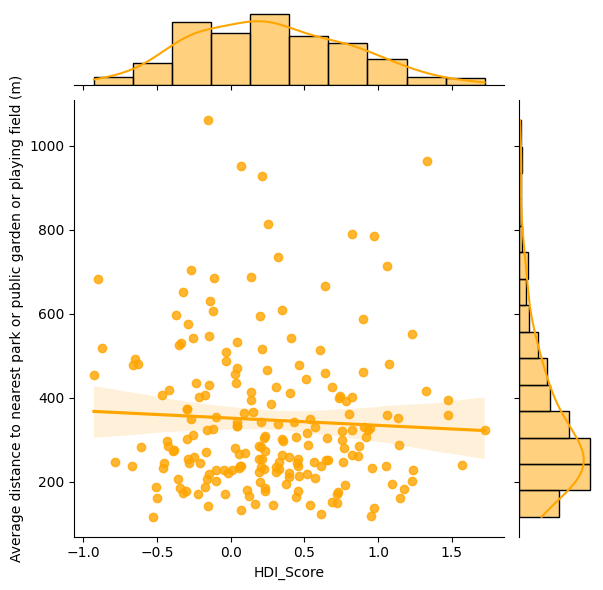

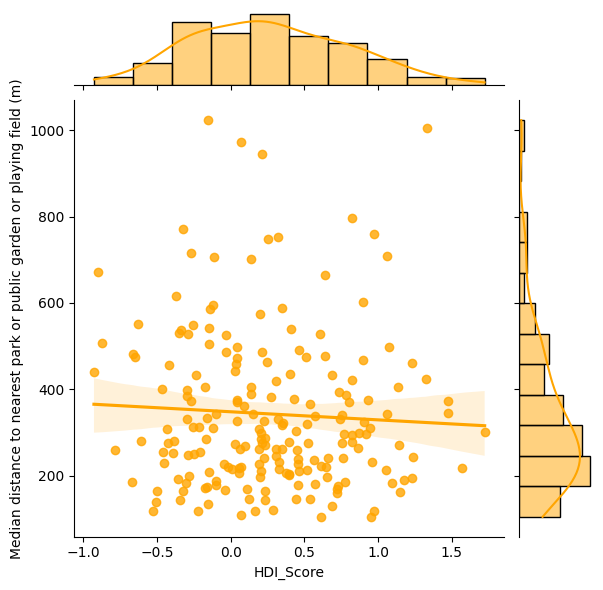

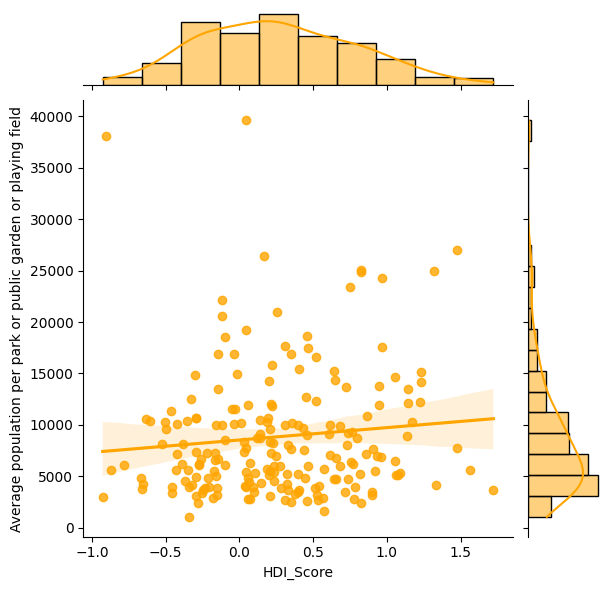

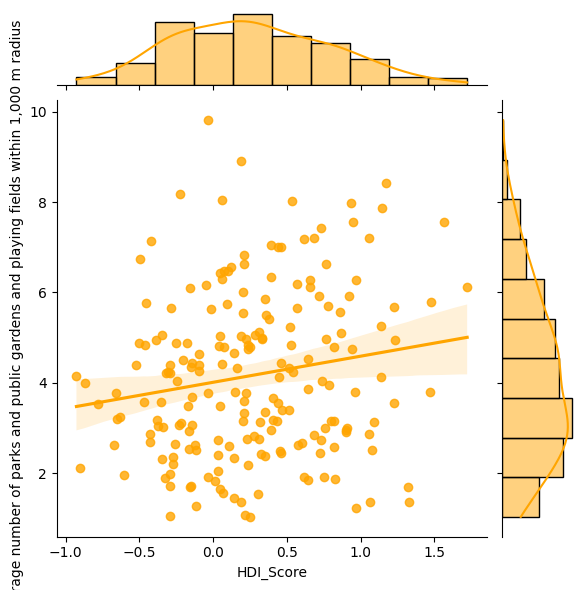

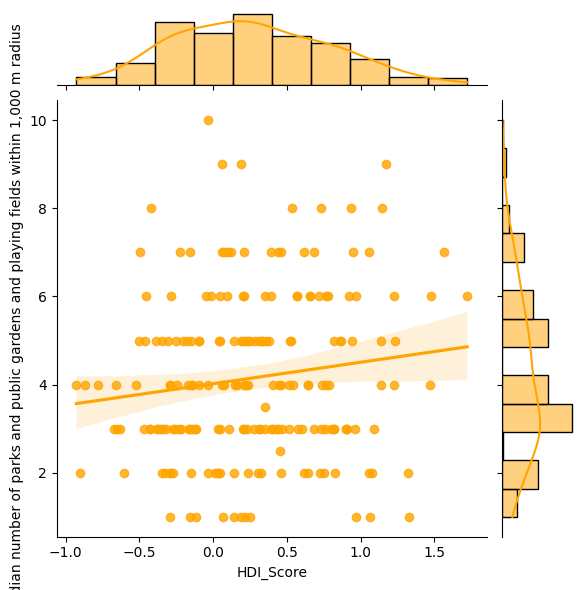

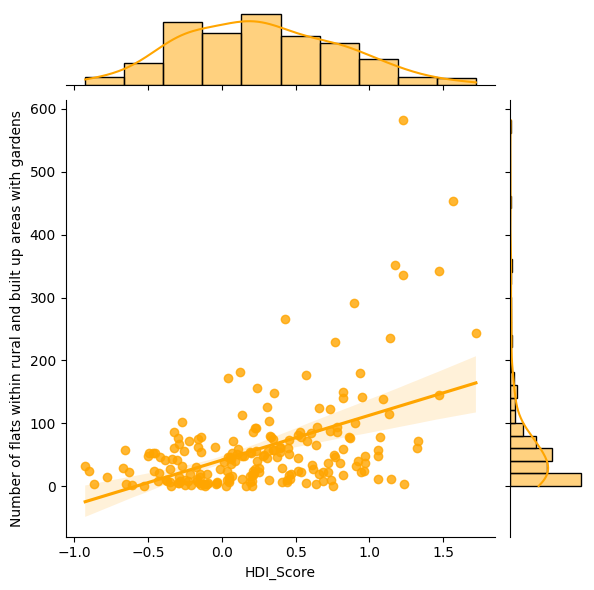

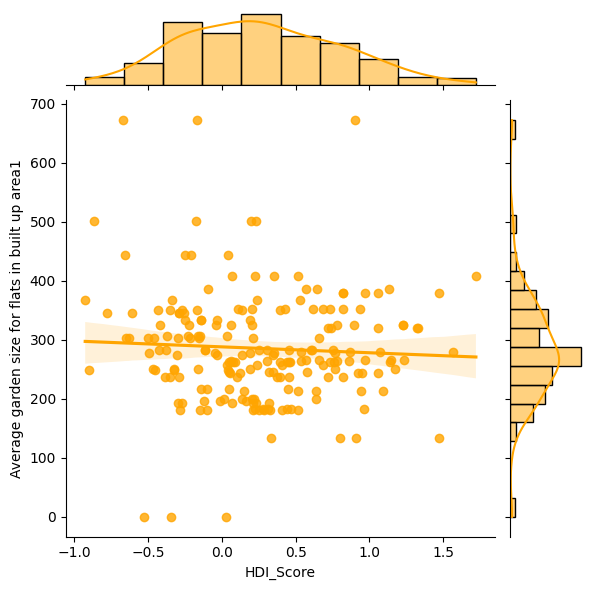

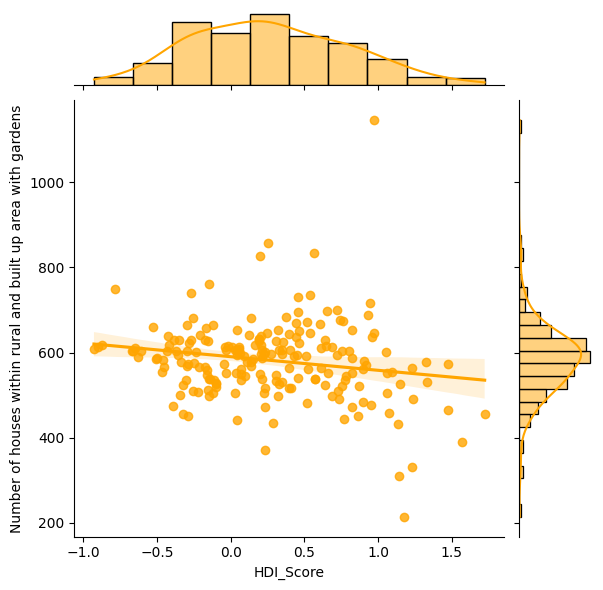

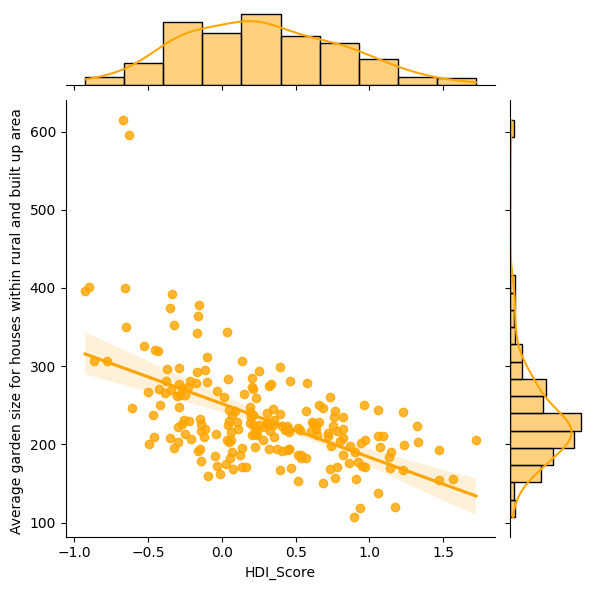

In [24]:
# Exploratory plots of Accessibility variables against HDI Score
# List of all y variables
yseries =['Average distance to nearest park or public garden or playing field (m)',
                      'Median distance to nearest park or public garden or playing field (m)',
                      'Average population per park or public garden or playing field',
                      'Average number of parks and public gardens and playing fields within 1,000 m radius',
                      'Median number of parks and public gardens and playing fields within 1,000 m radius',
                      'Number of flats within rural and built up areas with gardens',
                      'Average garden size for flats in built up area1',
                      'Number of houses within rural and built up area with gardens',
                      'Average garden size for houses within rural and built up area ']

# for element in the list yseries
for i in yseries:
    # plot a jointplot where y axis refers to the ith element in the list
    g = sns.jointplot(x='HDI_Score',y=i, kind ='reg', color='orange', data=HDIG_DY);

Spatial Data


In [25]:
## mount google drive
## from google.colab import drive
# drive.mount('/content/drive')

## Data downloaded from https://geoportal.statistics.gov.uk/datasets/357ee15b1080431491bf965394090c72_0/explore
## Read zipped shapefile saved on my Google Drive
# shp = gpd.read_file('/content/drive/MyDrive/SpatialData/Lower_layer_Super_Output_Areas_Dec_2011_Boundaries_Full_Clipped_BFC_EW_V3_2022_1117503576712596763.zip')
# shp.head()


In [26]:
## Create subset of LSOA shapefile for Dudley LAD
# dudley_shp =shp.loc[shp['LSOA11NM'].str.contains('Dudley'),:]
# dudley_shp.to_file('Dudley.geojson')
## Saved Geojson to Git repo

# dudley_shp.explore()

The above code is not required to reproduce this analysis as the resulting spatialdataset is loaded in below. However, should someone wish to replicate the analysis across different geographies the following is required:
1. Download the dataset from the provided link (https://geoportal.statistics.gov.uk/datasets/357ee15b1080431491bf965394090c72_0/explore) and upload it to your google drive.  
2. Uncomment the single hashed code and run the first cell. Give Colab permission to access your drive when prompted.
3. Uncomment the second cell, make alterations to the .loc function to target the area of interest.

In [27]:
# Read spatial data subset created using the code above that has been saved to github repo
dudley_shp = gpd.read_file('https://github.com/SJRUni/GEOG5990M/raw/refs/heads/main/Dudley.geojson')
# Check it has all worked as intended
dudley_shp.explore()

In [28]:
# Join HDI and Green space accessibility data to LSOAs for Dudley and check it has worked as intended
dudley_HDI = dudley_shp.merge(HDIG_DY, how='left', left_on='LSOA11CD', right_on='LSOA code')
dudley_HDI.explore()

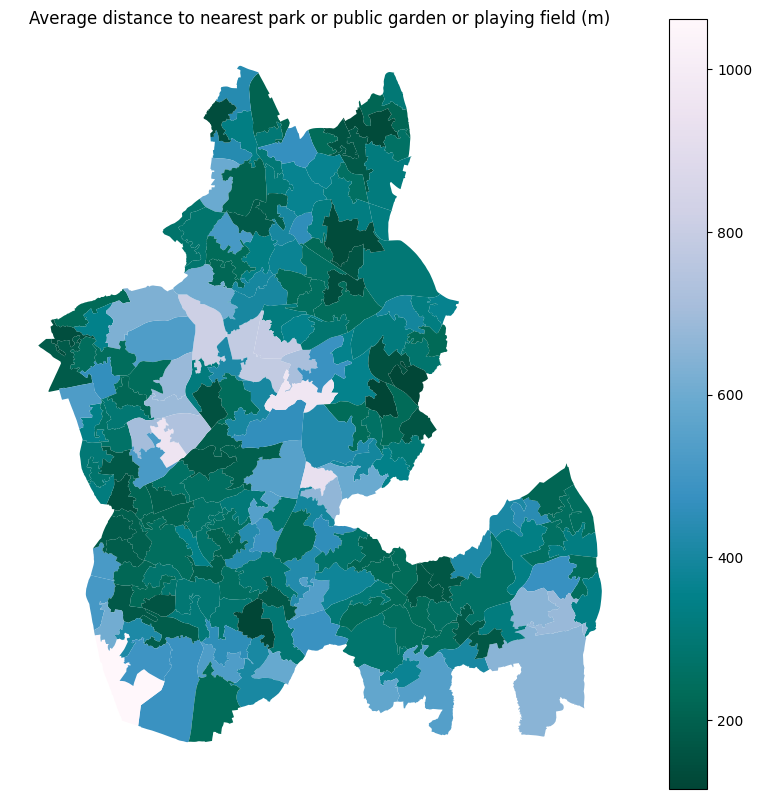

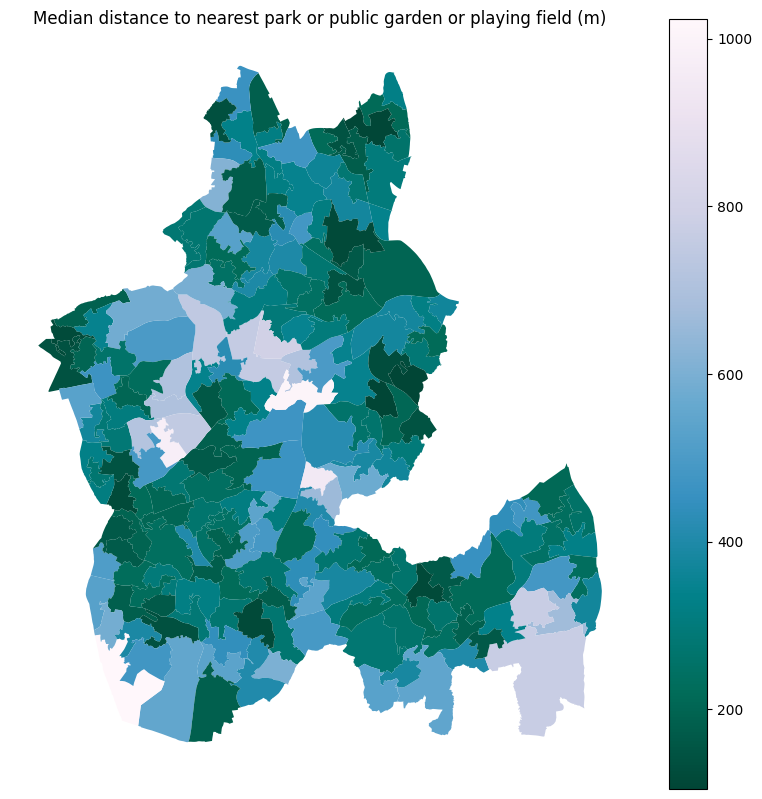

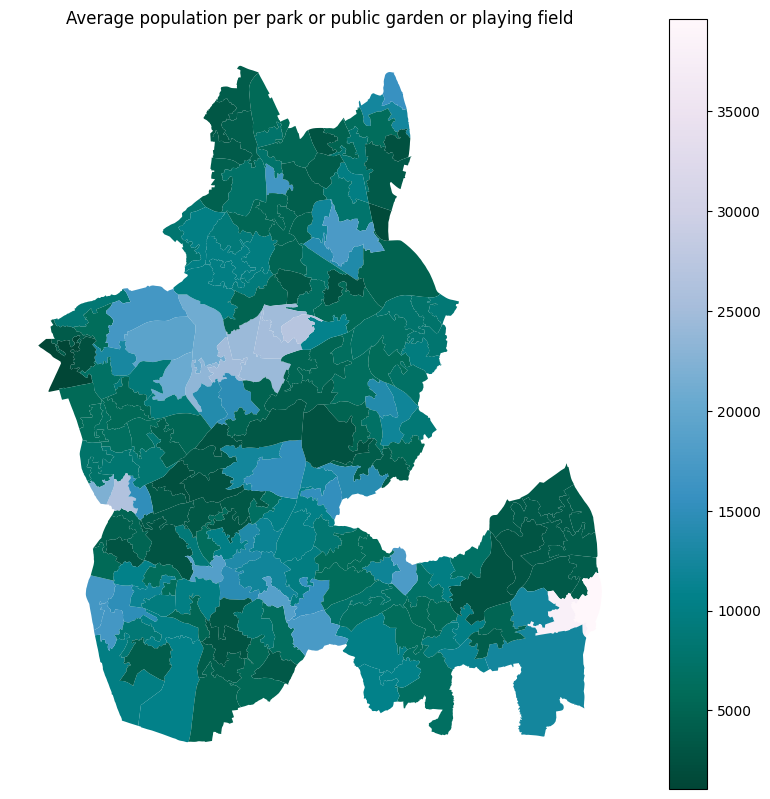

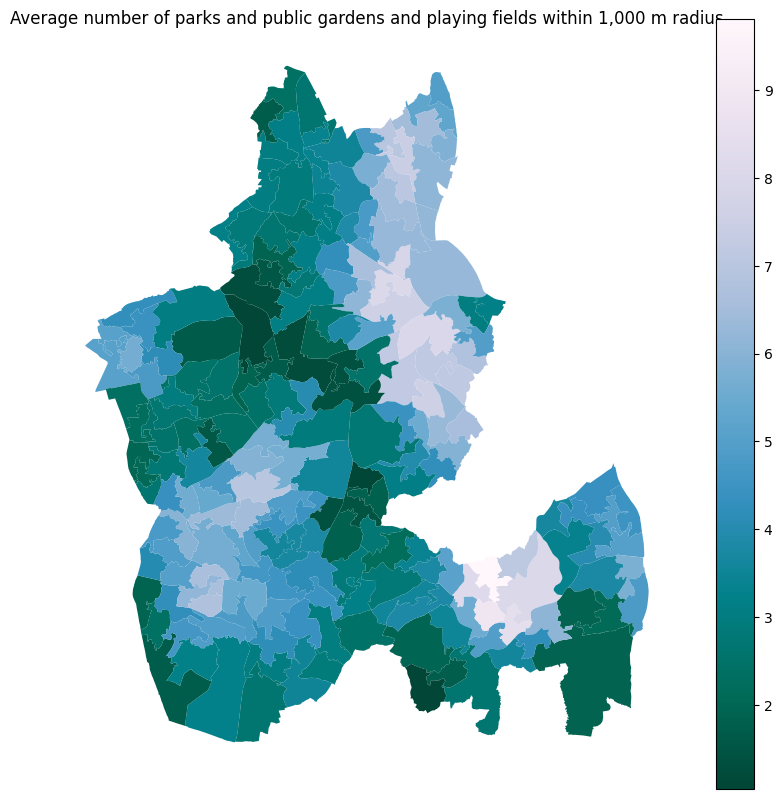

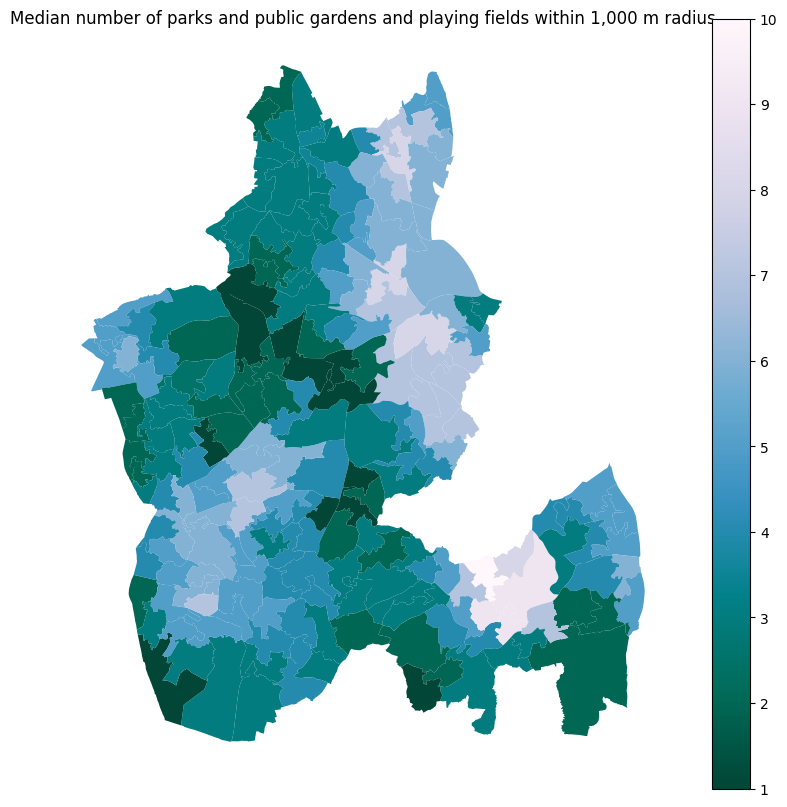

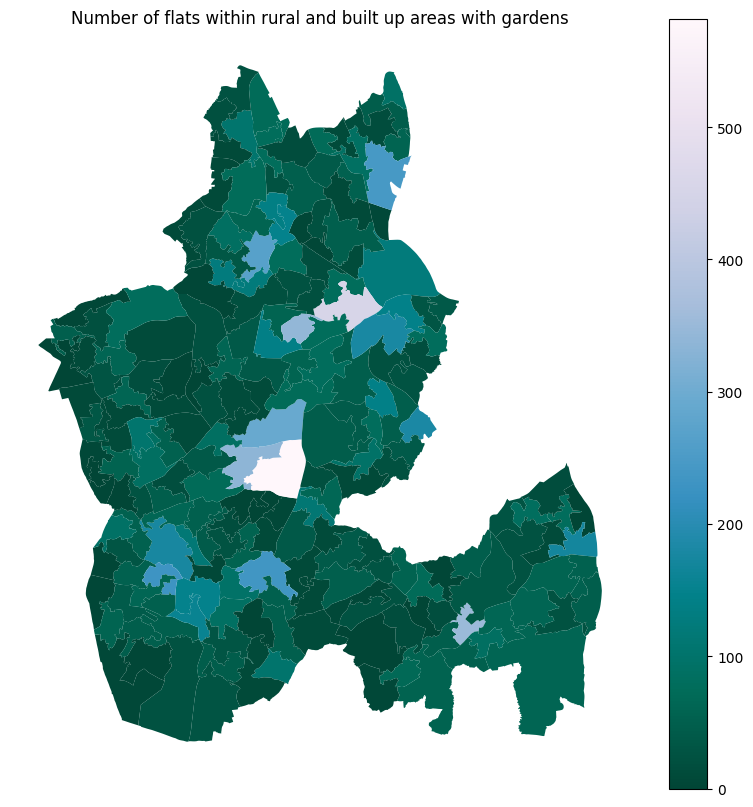

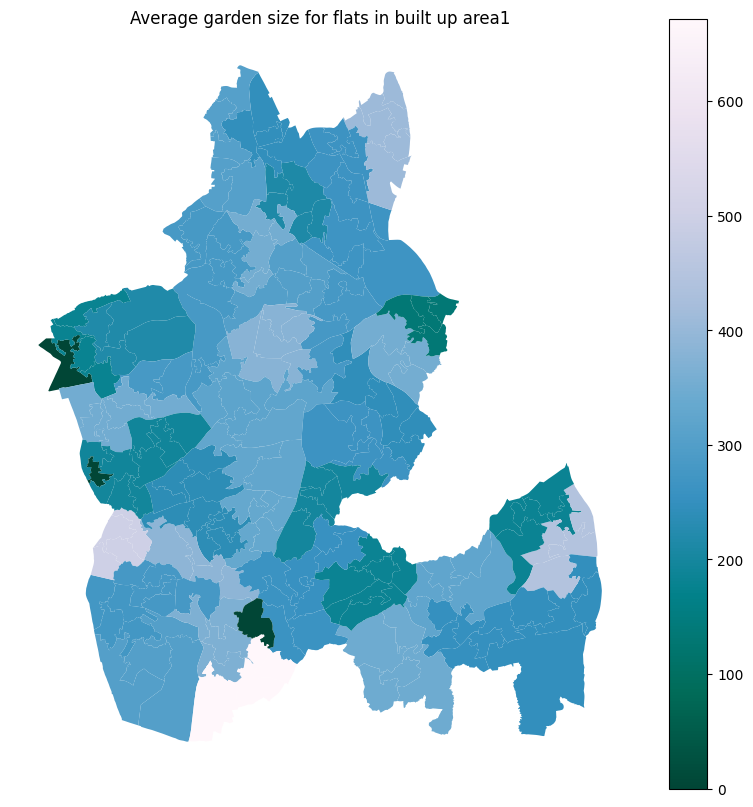

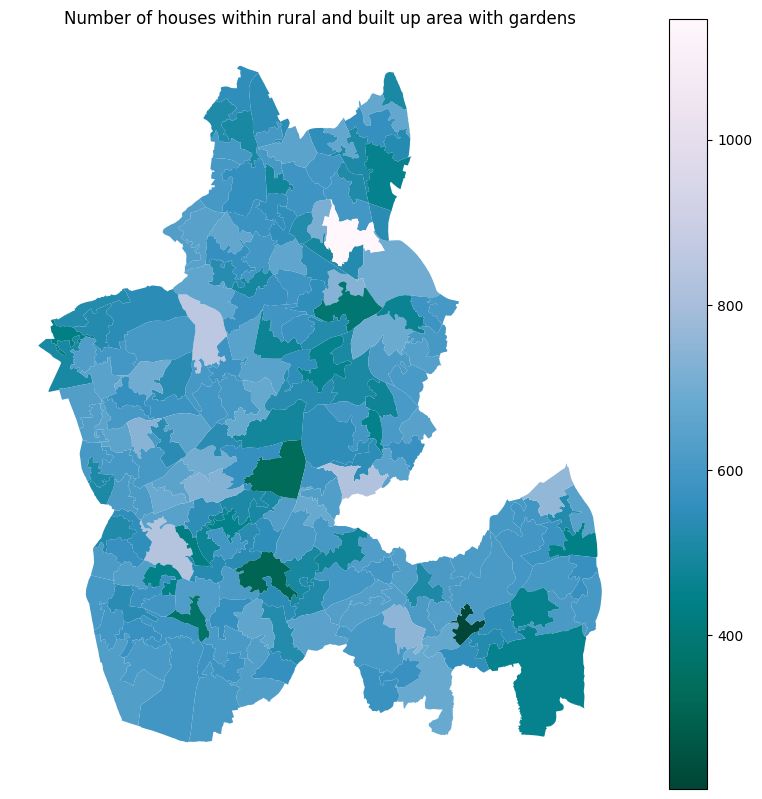

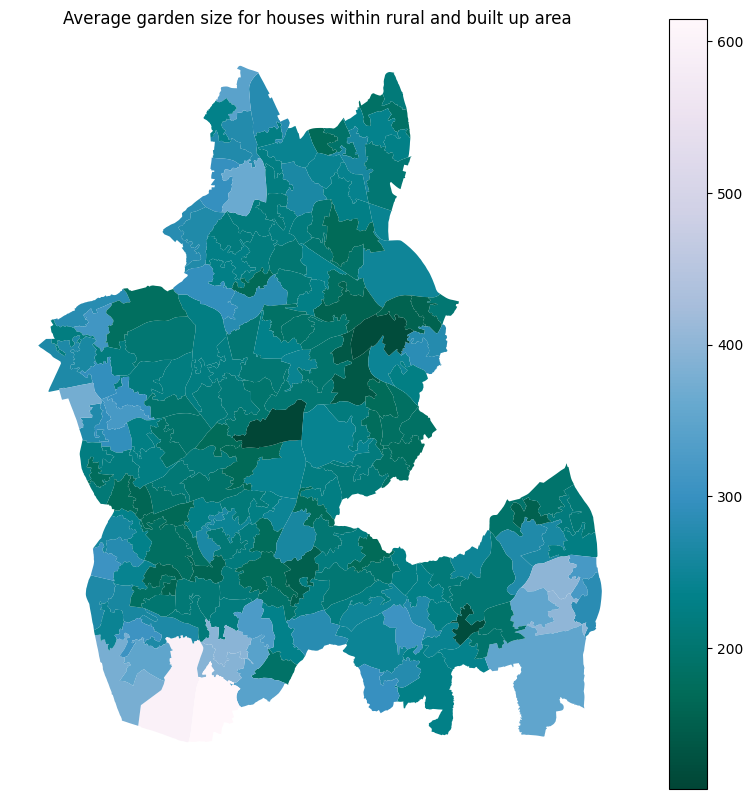

In [29]:
# Create a list of the columns we want to plot that includes HDI values (Kept in case of later need)
# cols =['HDI_decile', 'HDI_Score' ,'Average distance to nearest park or public garden or playing field (m)',
 #                     'Median distance to nearest park or public garden or playing field (m)',
 #                     'Average population per park or public garden or playing field',
  #                    'Average number of parks and public gardens and playing fields within 1,000 m radius',
   #                   'Median number of parks and public gardens and playing fields within 1,000 m radius']

# Map Green Space accessibility columns to look for any spatial patterns
# create a for loop for plotting a map of each domain saving the need to write out 6 blocks of code for each visualisation
# for each item in a range from 0 to 6 (number of items in the cols list) . reusing previously defined yseries
for i in range (0, len(yseries)):

    # produce a plot
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))

    # get the ith item in the column list and plot
    dudley_HDI.plot(column=yseries[i],

    # reduce linewidth between polygons
    linewidth =0.1,
    # show the legend
    legend=True,
    # define the legend palette
    cmap='PuBuGn_r',
    # define axis
    ax=ax,
    )
    # Plot without axis showing
    ax.axis('off')
    # Add title to the plot
    ax.set_title(yseries[i])
    # Show the plot
    plt.show()

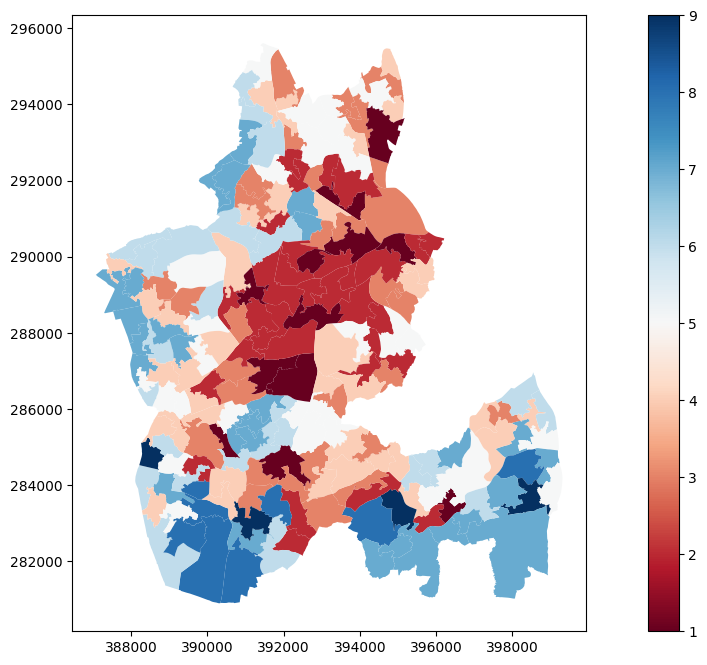

In [30]:
# Exploratory plot of HDI deciles
f,ax = plt.subplots(1, figsize=(16,8))
# Plot the LSOAs, specifying to plot the 'IMD' column
dudley_HDI.plot(ax=ax, column ='HDI_Decile', cmap='RdBu', legend=True)
# show the map
plt.show()

In [31]:
# Run Spearman's correlation on all fields.
HDIG_corr = dudley_HDI[['HDI_Score', 'Average distance to nearest park or public garden or playing field (m)',
                      'Median distance to nearest park or public garden or playing field (m)',
                      'Average population per park or public garden or playing field',
                      'Average number of parks and public gardens and playing fields within 1,000 m radius',
                      'Median number of parks and public gardens and playing fields within 1,000 m radius',
                      'Number of flats within rural and built up areas with gardens',
                      'Average garden size for flats in built up area1',
                      'Number of houses within rural and built up area with gardens',
                      'Average garden size for houses within rural and built up area ']].corr(method = 'spearman')
HDIG_corr

,HDI_Score,Average distance to nearest park or public garden or playing field (m),Median distance to nearest park or public garden or playing field (m),Average population per park or public garden or playing field,"Average number of parks and public gardens and playing fields within 1,000 m radius","Median number of parks and public gardens and playing fields within 1,000 m radius",Number of flats within rural and built up areas with gardens,Average garden size for flats in built up area1,Number of houses within rural and built up area with gardens,Average garden size for houses within rural and built up area
HDI_Score,1.000000,-0.060334,-0.060226,0.110269,0.152824,0.126449,0.420365,-0.052402,-0.167365,-0.538631
Average distance to nearest park or public garden or playing field (m),-0.060334,1.000000,0.983962,0.094447,-0.540016,-0.520263,-0.058067,0.068959,0.015992,0.162428
Median distance to nearest park or public garden or playing field (m),-0.060226,0.983962,1.000000,0.126849,-0.539664,-0.521573,-0.058915,0.069256,0.023064,0.137018
Average population per park or public garden or playing field,0.110269,0.094447,0.126849,1.000000,-0.244791,-0.235421,-0.045147,-0.053365,0.022710,-0.085600
"Average number of parks and public gardens and playing fields within 1,000 m radius",0.152824,-0.540016,-0.539664,-0.244791,1.000000,0.977956,0.189900,-0.019194,-0.065449,-0.251278
"Median number of parks and public gardens and playing fields within 1,000 m radius",0.126449,-0.520263,-0.521573,-0.235421,0.977956,1.000000,0.193769,0.004117,-0.056436,-0.240253
Number of flats within rural and built up areas with gardens,0.420365,-0.058067,-0.058915,-0.045147,0.189900,0.193769,1.000000,0.093316,-0.268816,-0.308994
Average garden size for flats in built up area1,-0.052402,0.068959,0.069256,-0.053365,-0.019194,0.004117,0.093316,1.000000,-0.062356,0.174820
Number of houses within rural and built up area with gardens,-0.167365,0.015992,0.023064,0.022710,-0.065449,-0.056436,-0.268816,-0.062356,1.000000,0.112316
Average garden size for houses within rural and built up area,-0.538631,0.162428,0.137018,-0.085600,-0.251278,-0.240253,-0.308994,0.174820,0.112316,1.000000


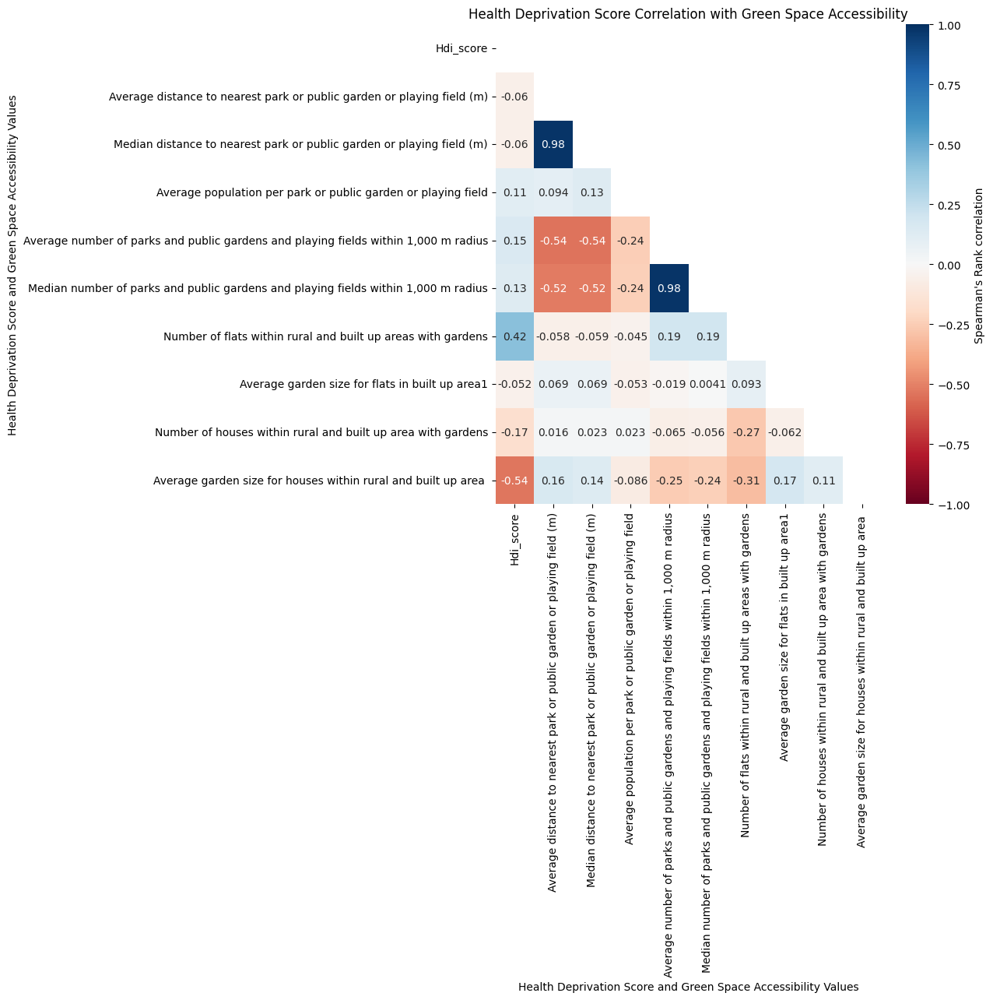

In [32]:
# Plot the above correlations so they are clearer to read
# define plot size
fig,ax = plt.subplots(figsize=(8,8))

# define mask to apply to upper right hand corner of the plot
data_to_mask = np.triu(np.ones_like(HDIG_corr))

# define axis tick labels
# get the index and the columns, replace the underscores with spaces and remove 'domain ' from the name
x_axis_labels = HDIG_corr.columns
y_axis_labels = HDIG_corr.index

# for each element in the list of x_axis_labels, capitalize it
x_axis_labels = [element.capitalize() for element in x_axis_labels]
y_axis_labels = [element.capitalize() for element in y_axis_labels]

# plot a heatmap of the correlation dataframe
sns.heatmap(HDIG_corr,
            # annotate so spearman's rank correlation values are displayed on the squares
            annot=True,
            # define colourmap
            cmap='RdBu',
            # define value of minimum colour on cbar
            vmin=-1,
            # define value of maximum colour on cbar
            vmax=1,
            # add the mask
            mask=data_to_mask,
            # use the custom tick labels
            xticklabels=x_axis_labels,
            yticklabels=y_axis_labels,
            # add a label to the cbar
            cbar_kws={'label': "Spearman's Rank correlation"},
            # plot on the axis we defined
            ax=ax)

# Set axis labels
ax.set(xlabel="Health Deprivation Score and Green Space Accessibility Values",
       ylabel="Health Deprivation Score and Green Space Accessibility Values",
      title ='Health Deprivation Score Correlation with Green Space Accessibility' );

# Data Visualisation
### Non-Spatial Visualisation
 Visualisation is intended for policy makers to highlight the correlation between lower average garden space and greater health deprivation (poorer health outcomes).This is not to suggest that the relationship is causal, only to demonstrate that there is a clear relationship.

 The potential use of this would be to highlight areas where greater provision of public open green space could be implemented (or removal limited) in areas with poor access / health outcomes.


Text(0.5, 1.0, 'Average Garden Size (m²) vs Health Deprivation Index Score for Dudley MBC LSOAs')

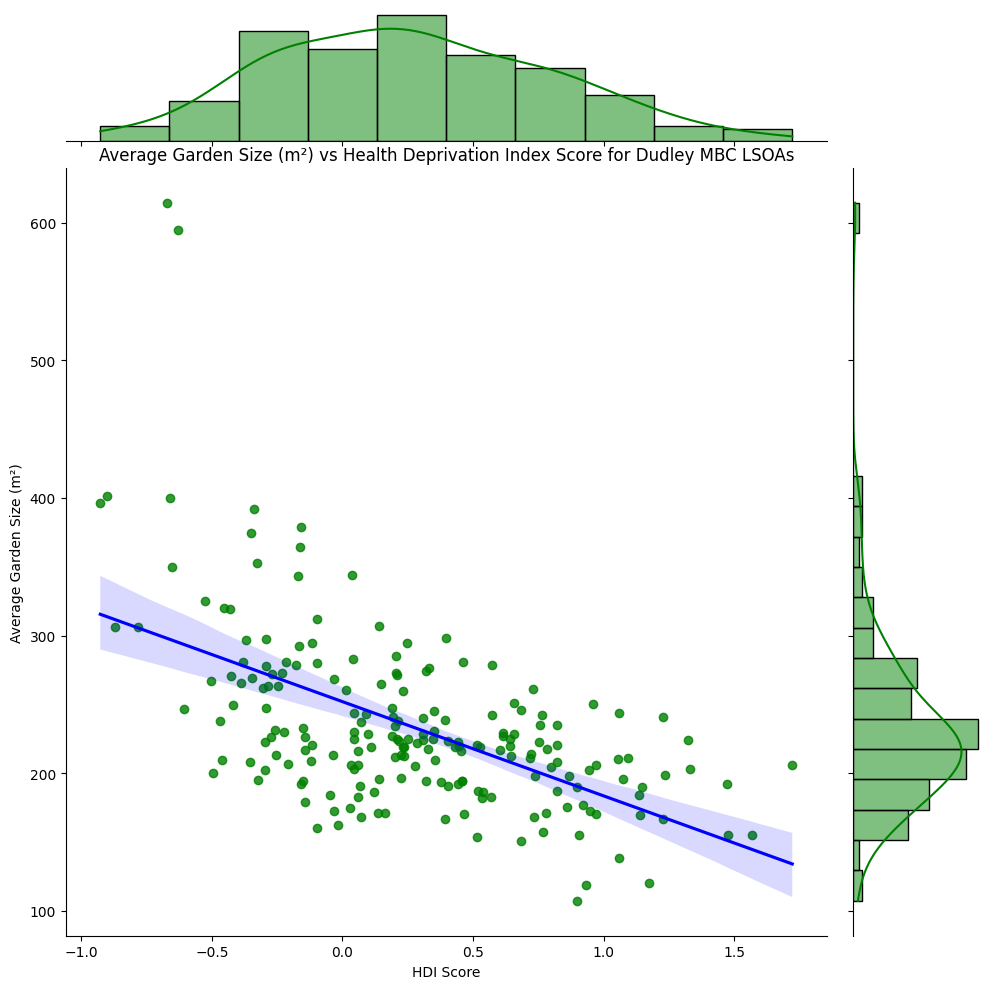

In [35]:
# Define regression plot. This shows the normal distribution of the two datasets and how the values are related
g = sns.jointplot(x='HDI_Score',y='Average garden size for houses within rural and built up area ', color='green', kind ='reg', data=HDIG_DY, height = 10, line_kws=dict(color="blue"))
# Regression line in contrasting colour for clarity.

# Rename the x-axis
g.ax_joint.set_xlabel("HDI Score")
# Rename the y-axis
g.ax_joint.set_ylabel("Average Garden Size (m²)")

# Add title
plt.title('Average Garden Size (m²) vs Health Deprivation Index Score for Dudley MBC LSOAs')



### Spatial Data Visualisation
 This plot is intended for policy makers to inform decisions around open green spaces. The plot shows health outcomes and private garden space are poor. These areas could be targeted for greater public health provision of Public Open Space, or act as as part of an evidence base to refuse proposals that would remove exisiting provision.

 The current criteria for the highlighted LSOAs is an area with a Health Deprivation Decile value of 2 or less, and an average private garden size of 200m2 or less. These values can be edited by tweaking the final function in the cell below.

 The plot avoids using pure white so that all LSOAs are visible. The palette is the same for both plots, and the polarity is the same so that darker means a lower (i.e. poorer performing) value in both plots. The highlighted plots are in a contrasting blue, and these are matched across all of the subplots so that the plots can be more easily compared.  The colour palette utilised is also intended to be accesible to those with various forms of colourblindness.

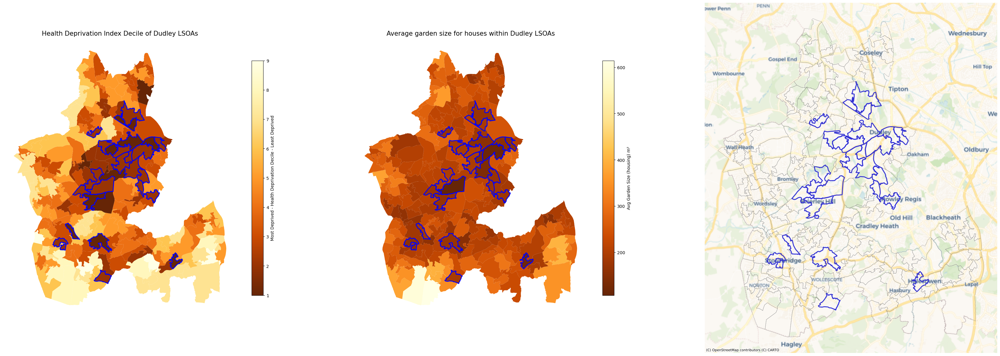

In [34]:
# Plotting two subplots for Dudley mBC
f, ax = plt.subplots(1, 3, figsize=(42, 20))

# HDI Plot
dudley_HDI.plot(ax=ax[0], column='HDI_Decile', cmap='YlOrBr_r', legend=True, legend_kwds={'shrink': 0.5, 'label': "Most Deprived - Health Deprivation Decile - Least Deprived"})
ax[0].set_axis_off()
ax[0].set_title('Health Deprivation Index Decile of Dudley LSOAs', fontsize=15)

# Garden Size Plot
dudley_HDI.plot(ax=ax[1],column='Average garden size for houses within rural and built up area ', cmap='YlOrBr_r', legend=True, legend_kwds={'shrink': 0.5, 'label': "Avg Garden Size (housing) m²"})
ax[1].set_axis_off()
ax[1].set_title('Average garden size for houses within Dudley LSOAs', fontsize=15)


# 3rd plot intended to provide context for the highlighted locations
dudley_HDI.boundary.plot(ax=ax[2], linewidth=0.4, color='gray')
ax[2].set_axis_off()
# add basemap with the appropriate crs
ctx.add_basemap(ax[2], source=ctx.providers.CartoDB.Voyager, crs=dudley_HDI.crs)


# Create df which highlights areas of interest for preservation / green space expansion. Lowest HDI deciles (=<2) and <200m2 of garden space
filtered = ((dudley_HDI['HDI_Decile'] <= 2) & (dudley_HDI['Average garden size for houses within rural and built up area '] <= 200))
# filtered LSOA polygons as df ready for plotting
highlighted = dudley_HDI[filtered]
# Plot the highlighted areas with blue outline
highlighted.plot(ax=ax[0], edgecolor='blue', facecolor='none', linewidth=2)
highlighted.plot(ax=ax[1], edgecolor='blue', facecolor='none', linewidth=2)
highlighted.plot(ax=ax[2], edgecolor='blue', facecolor='none', linewidth=2)

plt.show()

## References

<p><a href="https://assets.publishing.service.gov.uk/government/uploads/system/uploads/attachment_data/file/835115/IoD2019_Statistical_Release.pdf">[1] </a>	The English Indices of Deprivation 2019 (IoD2019). Ministry of Housing, Communities & Local Government. [Online]. September 2019. [Accessed 25 July 2025] Available from: https://assets.publishing.service.gov.uk/government/uploads/system/uploads/attachment_data/file/835115/IoD2019_Statistical_Release.pdf</p>

<p><a href="https://opendatacommunities.org/slice?dataset=http%3A%2F%2Fopendatacommunities.org%2Fdata%2Fsocietal-wellbeing%2Fimd2019%2Findices">[2] </a>English Indices of Deprivation 2019 - LSOA Level. Ministry of Housing, Communities & Local Government. [Online]. 2019. [Accessed 25 July 2025] Available from: https://opendatacommunities.org/slice?dataset=http%3A%2F%2Fopendatacommunities.org%2Fdata%2Fsocietal-wellbeing%2Fimd2019%2Findices</p>


<p><a href="https://www.ons.gov.uk/economy/environmentalaccounts/datasets/accesstopublicgreenspaceingreatbritain">[3] </a>Access to public green space in Great Britain. Office for National Statistics. [Online]. 26 April 2021. [Accessed 25 July 2025] Available from: https://www.ons.gov.uk/economy/environmentalaccounts/datasets/accesstopublicgreenspaceingreatbritain</p>

<p><a href="https://geoportal.statistics.gov.uk/datasets/ons::lower-layer-super-output-areas-december-2011-boundaries-ew-bfc-v3/about">[4] </a>Lower layer Super Output Areas (December 2011) Boundaries EW BFC (V3). Office for National Statistics Open Geography portal. [Online]. December 2011. [Accessed 27 July 2025] Available from: https://geoportal.statistics.gov.uk/datasets/ons::lower-layer-super-output-areas-december-2011-boundaries-ew-bfc-v3/about</p>

<p><a href="https://github.com/FrancescaPontin/GEOG5990">[5]</a>GEOG5990M course materials</p>

